<a href="https://colab.research.google.com/github/PondKann/ChestXray_Classification/blob/main/Score_CAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### import

In [1]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
%matplotlib inline
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import cv2
import numpy as np
import pandas as pd
from torchsummary import summary
from skimage.io import imread, imsave
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

import PIL
from PIL import Image

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input

In [2]:
# set the matplotlib backend so figures can be saved in the background
import matplotlib
matplotlib.use("Agg")

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model, Model
from tensorflow.keras import datasets, layers, models

from imutils import paths
import argparse

from sklearn.model_selection import KFold
from sklearn import metrics
from scipy.stats import zscore


import matplotlib.image as mpimg
from matplotlib.pyplot import savefig

import itertools
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

#### Load data // KKU

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
data_dir = '/content/drive/My Drive/Senior Project/CXR Image3class/Image'

train 3 class

In [5]:
Normal151_dir = os.path.join(data_dir,'Normal151')
TB150_dir = os.path.join(data_dir,'TB150')
CA150_dir = os.path.join(data_dir,'CA150')

All_3class_dir = os.path.join(data_dir,'All_3class')

#### Load data // Gmail

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_dir = '/content/drive/My Drive/Senior Project/CXR Image3class'

train 3 class

# Data + Train-test model

####Data train 3 class   +  split train test
ข้อมูลใน All_3class_dir รวมภาพทั้ง 3 คลาส รวม 450 ภาพ TB150, Normal151 (เอามาแค่150) และ CA150 (CA คือ lungcancer)

In [6]:
Normal151_dir = os.path.join(data_dir,'Normal151')
TB150_dir = os.path.join(data_dir,'TB150')
CA150_dir = os.path.join(data_dir,'CA150')

All_3class_dir = os.path.join(data_dir,'All_3class')

In [7]:
normal = []
for i in range(len(os.listdir(Normal151_dir))):
    img = os.listdir(Normal151_dir)[i]
    normal.append(img)
    
tnormal = pd.DataFrame({'ImageName':[normal][0],
                                       'NameType': "Normal" ,
                                       'NumberType': 0                      })

In [8]:
tuberculosis = []
for i in range(len(os.listdir(TB150_dir))):
    img = os.listdir(TB150_dir)[i]
    tuberculosis.append(img)

ttuberculosis = pd.DataFrame({'ImageName':[tuberculosis][0],
                                       'NameType': "Tuberculosis" ,
                                       'NumberType': 1                        })

In [9]:
lungcancer = []
for i in range(len(os.listdir(CA150_dir))):
    img = os.listdir(CA150_dir)[i]
    lungcancer.append(img)

tlungcancer = pd.DataFrame({'ImageName':[lungcancer][0],
                                       'NameType': "Lungcancer" ,
                                       'NumberType': 2                        })

In [10]:
data_train3 = pd.concat([tnormal[:-1], ttuberculosis, tlungcancer])
data_train3[-3:]

,ImageName,NameType,NumberType
147,ca2.jpg,Lungcancer,2
148,ca26.jpg,Lungcancer,2
149,ca8.jpg,Lungcancer,2


In [11]:
train_img_Dense = []
for ImageName in tqdm(data_train3['ImageName']):              
    image_path = All_3class_dir +'/' + ImageName                  
    img = cv2.imread(image_path)                                          
    img = cv2.resize(img, (224, 224))                                      
    train_img_Dense.append(img)
data_Dense = np.array(train_img_Dense, dtype="float32") / 255.0

labels_Dense = np.array(data_train3[['NameType']] )        
labels_Dense.shape = (len(labels_Dense),) 
le_Dense = LabelEncoder()                                                                     
labels_Dense = le_Dense.fit_transform(labels_Dense)                                         
labels_Dense = to_categorical(labels_Dense, num_classes=3)   

100%|██████████| 450/450 [02:04<00:00,  3.61it/s]


In [12]:
(x_train_Dense, x_test_Dense, y_train_Dense, y_test_Dense ) = train_test_split(data_Dense, labels_Dense,
	                                                                                                test_size=0.25, random_state=40)

#### 16 fine cate
--> 0.912

In [ ]:
BS = 16                                                     ##
filepath = "model16_fine_cate.h5"                  ##

train_img_Dense = []
for ImageName in tqdm(data_train3['ImageName']):              
    image_path = All_3class_dir +'/' + ImageName                  
    img = cv2.imread(image_path)                                          
    img = cv2.resize(img, (224, 224))                                      
    train_img_Dense.append(img)
data_Dense = np.array(train_img_Dense, dtype="float32") / 255.0

labels_Dense = np.array(data_train3[['NameType']] )        
labels_Dense.shape = (len(labels_Dense),) 
le_Dense = LabelEncoder()                                                                     
labels_Dense = le_Dense.fit_transform(labels_Dense)                                         
labels_Dense = to_categorical(labels_Dense, num_classes=3)                   

aug = ImageDataGenerator(	rotation_range=15,				width_shift_range=0.1, 		height_shift_range=0.1,
		shear_range=0.15,		horizontal_flip=True,  		fill_mode="nearest")

callback = tf.keras.callbacks.EarlyStopping(  monitor="val_accuracy",    patience=15,    mode="max" )

checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, 
                    save_best_only=True, mode='max')

reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=6, 
                                   verbose=1, mode='max', min_lr=0.00001)

100%|██████████| 450/450 [01:51<00:00,  4.05it/s]


In [ ]:
le_Dense.classes_

array(['Lungcancer', 'Normal', 'Tuberculosis'], dtype=object)

In [ ]:
(x_train_Dense, x_test_Dense, y_train_Dense, y_test_Dense ) = train_test_split(data_Dense, labels_Dense,
	                                                                                                test_size=0.25, random_state=40)

In [ ]:
base_model_Dense = tf.keras.applications.DenseNet201(input_shape=(224, 224, 3), include_top=False, weights="imagenet")
base_model_Dense.trainable = True
for layer in base_model_Dense.layers[:400]:    #fix w & bias in layer 0-400
    layer.trainable = False

#Add custom head
average_pooling_layer = tf.keras.layers.GlobalAveragePooling2D()(base_model_Dense.output)
prediction_layer = tf.keras.layers.Dense(units=3, activation="softmax")(average_pooling_layer)   
model_Dense = tf.keras.models.Model(inputs=base_model_Dense.input, outputs=prediction_layer)

model_Dense.compile(optimizer=RMSprop(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

##
H16_fine_cate = model_Dense.fit( x=aug.flow(x_train_Dense, y_train_Dense, batch_size=BS),
	                                            validation_data=(x_test_Dense, y_test_Dense),
	                                            steps_per_epoch=len(x_train_Dense) // BS,
	                                            epochs=100,  callbacks = [callback, checkpoint, reduce_lr])
##
pred_H16_fine_cate = model_Dense.predict(x_test_Dense)
    

print(classification_report(y_test_Dense.argmax(axis=1),	                
                                        pred_H16_fine_cate.argmax(axis=1),  
                                        target_names=le_Dense.classes_))

# #download ไฟล์ลงเครื่อง
# from google.colab import files
# files.download( filepath)       

74850304/74836368 [==============================] - 3s 0us/step
Epoch 1/100
21/21 [==============================] - ETA: 0s - loss: 0.7519 - accuracy: 0.6791
Epoch 1: val_accuracy improved from -inf to 0.48673, saving model to model16_fine_cate.h5
21/21 [==============================] - 60s 1s/step - loss: 0.7519 - accuracy: 0.6791 - val_loss: 1.2321 - val_accuracy: 0.4867 - lr: 1.0000e-04
Epoch 2/100
21/21 [==============================] - ETA: 0s - loss: 0.4503 - accuracy: 0.8193
Epoch 2: val_accuracy improved from 0.48673 to 0.57522, saving model to model16_fine_cate.h5
21/21 [==============================] - 10s 485ms/step - loss: 0.4503 - accuracy: 0.8193 - val_loss: 1.1021 - val_accuracy: 0.5752 - lr: 1.0000e-04
Epoch 3/100
21/21 [==============================] - ETA: 0s - loss: 0.2481 - accuracy: 0.9346
Epoch 3: val_accuracy improved from 0.57522 to 0.60177, saving model to model16_fine_cate.h5
21/21 [==============================] - 10s 474ms/step - loss: 0.2481 - accura

In [ ]:
from plotly import __version__
%matplotlib inline
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
cf.go_offline()

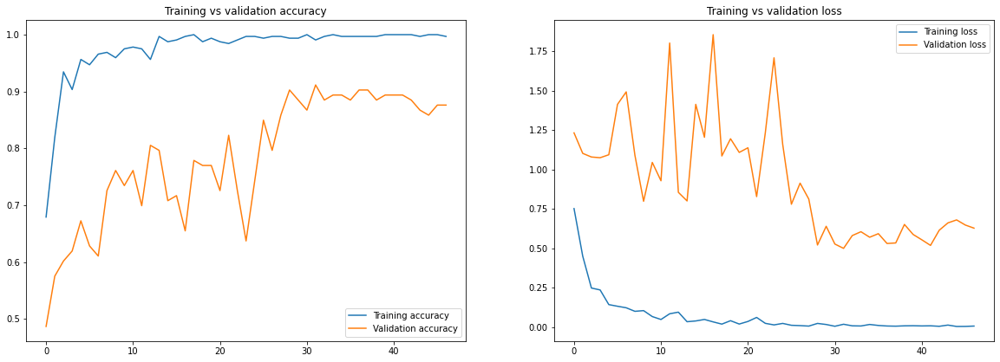

<Figure size 432x288 with 0 Axes>

In [ ]:
H_Dense = H16_fine_cate                           ##
pred_Dense = pred_H16_fine_cate              ##

accuracy = H_Dense.history['accuracy']
val_accuracy  = H_Dense.history['val_accuracy']

loss = H_Dense.history['loss']
val_loss = H_Dense.history['val_loss']
plt.figure(figsize=(20,15))

plt.subplot(2, 2, 1)
plt.plot(accuracy, label = "Training accuracy")
plt.plot(val_accuracy, label="Validation accuracy")
plt.legend()
plt.title("Training vs validation accuracy")

plt.subplot(2,2,2)
plt.plot(loss, label = "Training loss")
plt.plot(val_loss, label="Validation loss")
plt.legend()
plt.title("Training vs validation loss")

plt.figure()
plt.show()

Confusion matrix, without normalization
[[29  0  7]
 [ 0 35  5]
 [ 2  0 35]]
Normalized confusion matrix
[[0.81 0.   0.19]
 [0.   0.88 0.12]
 [0.05 0.   0.95]]


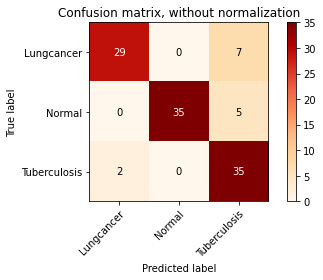

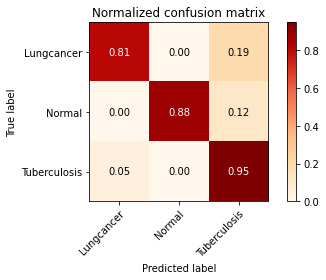

In [ ]:
y_pred = pred_H16_fine_cate.argmax(axis=1)            ##
y_true  = y_test_Dense.argmax(axis=1)
y_test = y_test_Dense.argmax(axis=1)
class_names = le_Dense.classes_

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.OrRd):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    print(cm)
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')
    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')
# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()

In [ ]:
model = load_model(filepath)

In [ ]:
pred_model = model.predict(x_test_Dense)

print(classification_report(y_test_Dense.argmax(axis=1),   pred_model.argmax(axis=1), target_names=le_Dense.classes_))

              precision    recall  f1-score   support

  Lungcancer       0.94      0.83      0.88        36
      Normal       1.00      0.95      0.97        40
Tuberculosis       0.81      0.95      0.88        37

    accuracy                           0.91       113
   macro avg       0.92      0.91      0.91       113
weighted avg       0.92      0.91      0.91       113



Confusion matrix, without normalization
[[30  0  6]
 [ 0 38  2]
 [ 2  0 35]]
Normalized confusion matrix
[[0.83 0.   0.17]
 [0.   0.95 0.05]
 [0.05 0.   0.95]]


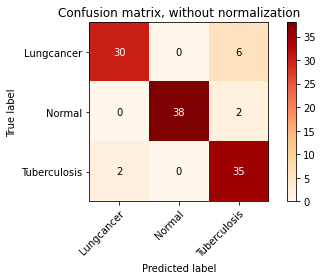

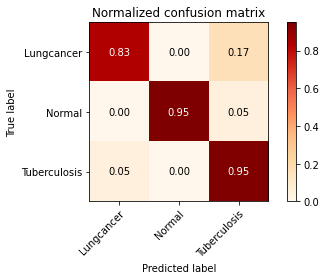

In [ ]:
y_pred = pred_model.argmax(axis=1)            ##
y_true  = y_test_Dense.argmax(axis=1)
y_test = y_test_Dense.argmax(axis=1)
class_names = le_Dense.classes_

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.OrRd):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    print(cm)
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax
np.set_printoptions(precision=2)
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')
# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()

#### เช็คโมเดล

  
* include_top=False  จะถึงแค่ bn และ relu  (Trainable params: 18,092,928 + Non-trainable params: 229,056 )
*  include_top=True จะมี avg_pool และ prediction (Trainable params: 20,013,928 + Non-trainable params: 229,056)

*  ถ้าเป็น include_top=False แล้วเอา GlobalAveragePooling + prediction มาต่อเอง  Output Shape ที่ได้ก็จะเหมือนกันกับ include_top=True เลย 

include_top=True

In [ ]:
base_model_Dense2 = tf.keras.applications.DenseNet201(input_shape=(224, 224, 3), include_top=True, weights="imagenet")
# base_model_Dense2.trainable = True
# for layer in base_model_Dense2.layers[:400]:    #fix w & bias in layer 0-400
#     layer.trainable = False

82534400/82524592 [==============================] - 1s 0us/step


In [ ]:
base_model_Dense2.summary()

Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_4 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_3[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_4[0][0]']       
                                )                                                       

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.417813 to fit



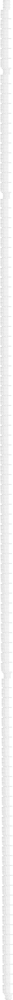

In [ ]:
keras.utils.plot_model(base_model_Dense2 , show_shapes=True)

In [ ]:
#Add custom head
average_pooling_layer = tf.keras.layers.GlobalAveragePooling2D()(base_model_Dense2.output)
prediction_layer = tf.keras.layers.Dense(units=3, activation="softmax")(average_pooling_layer)   
model_Dense2 = tf.keras.models.Model(inputs=base_model_Dense2.input, outputs=prediction_layer)

In [ ]:
model_Dense2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 230, 230, 3)  0          ['input_2[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d_2[0][0]']       
                                )                                                           

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.417813 to fit



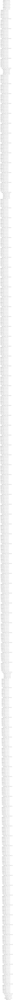

In [ ]:
keras.utils.plot_model(model_Dense2 , show_shapes=True)

# Score-CAM ใช้โมเดลที่เทรนเอง 
- Batch size = 16 
- finetune fix layer  0-400
- categorical 

https://github.com/tabayashi0117/Score-CAM/blob/master/gradcamutils.py

https://github.com/tabayashi0117/Score-CAM/blob/master/Score-CAM.ipynb

### 1) โหลดโมเดล + predict data test

ฟังก์ชัน read_and_preprocess_img กับ train_img_Dense ที่เขียนเอง ให้เอ้าพุทที่ต่างกัน

In [13]:
data_dir2 = '/content/drive/My Drive/Senior Project/CXR Image3class'
Model_dir = os.path.join(data_dir2,'Model')

In [14]:
os.listdir(Model_dir)

['model16_fine_cate2.h5']

In [15]:
path_model = Model_dir + '/model16_fine_cate2.h5'
model16_fine_cate2 = load_model(path_model)

In [16]:
p = model16_fine_cate2.predict(x_test_Dense)     

In [ ]:
# import เพื่อให้โชว์รูปได้ 
from plotly import __version__
%matplotlib inline

Confusion matrix, without normalization
[[30  0  6]
 [ 0 38  2]
 [ 2  0 35]]
Normalized confusion matrix
[[0.83 0.   0.17]
 [0.   0.95 0.05]
 [0.05 0.   0.95]]


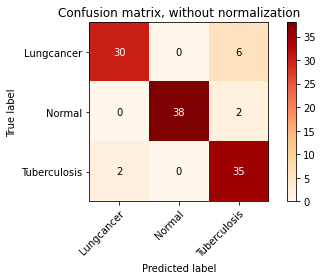

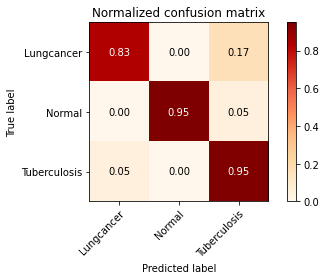

In [43]:
y_pred = p.argmax(axis=1)            ##
y_true  = y_test_Dense.argmax(axis=1)
y_test = y_test_Dense.argmax(axis=1)
class_names = le_Dense.classes_

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.OrRd):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    print(cm)
    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax
np.set_printoptions(precision=2)
# Plot non-normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names,
                      title='Confusion matrix, without normalization')
# Plot normalized confusion matrix
plot_confusion_matrix(y_test, y_pred, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
plt.show()

In [18]:
model16_fine_cate2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                              

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.417813 to fit



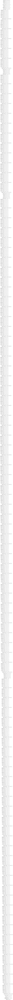

In [19]:
keras.utils.plot_model(model16_fine_cate2 , show_shapes=True)

### 2) สร้างฟังก์ชัน
* ScoreCam
* superimpose
* sofemax
* sigmoid
* read_and_preprocess_img
* my_preprocess_img  ตามวิธีที่ใช้เทรนโมเดล

In [20]:
def ScoreCam(model, img_array, layer_name, max_N=-1):

    cls = np.argmax(model.predict(img_array))
    act_map_array = Model(inputs=model.input, outputs=model.get_layer(layer_name).output).predict(img_array)
    
    # extract effective maps
    if max_N != -1:
        act_map_std_list = [np.std(act_map_array[0,:,:,k]) for k in range(act_map_array.shape[3])]
        unsorted_max_indices = np.argpartition(-np.array(act_map_std_list), max_N)[:max_N]
        max_N_indices = unsorted_max_indices[np.argsort(-np.array(act_map_std_list)[unsorted_max_indices])]
        act_map_array = act_map_array[:,:,:,max_N_indices]

    input_shape = model.layers[0].output_shape[0][1:]  # get input shape
    # 1. upsampled to original input size
    act_map_resized_list = [cv2.resize(act_map_array[0,:,:,k], input_shape[:2], interpolation=cv2.INTER_LINEAR) for k in range(act_map_array.shape[3])]
    # 2. normalize the raw activation value in each activation map into [0, 1]
    act_map_normalized_list = []
    for act_map_resized in act_map_resized_list:
        if np.max(act_map_resized) - np.min(act_map_resized) != 0:
            act_map_normalized = act_map_resized / (np.max(act_map_resized) - np.min(act_map_resized))
        else:
            act_map_normalized = act_map_resized
        act_map_normalized_list.append(act_map_normalized)
    # 3. project highlighted area in the activation map to original input space by multiplying the normalized activation map
    masked_input_list = []
    for act_map_normalized in act_map_normalized_list:
        masked_input = np.copy(img_array)
        for k in range(3):
            masked_input[0,:,:,k] *= act_map_normalized
        masked_input_list.append(masked_input)
    masked_input_array = np.concatenate(masked_input_list, axis=0)
    # 4. feed masked inputs into CNN model and softmax
    pred_from_masked_input_array = softmax(model.predict(masked_input_array))
    # 5. define weight as the score of target class
    weights = pred_from_masked_input_array[:,cls]
    # 6. get final class discriminative localization map as linear weighted combination of all activation maps
    cam = np.dot(act_map_array[0,:,:,:], weights)
    cam = np.maximum(0, cam)  # Passing through ReLU
    cam /= np.max(cam)  # scale 0 to 1.0
    
    return cam

In [21]:
def superimpose(original_img_path, cam, emphasize=False):
    
    img_bgr = cv2.imread(original_img_path)

    heatmap = cv2.resize(cam, (img_bgr.shape[1], img_bgr.shape[0]))
    if emphasize:
        heatmap = sigmoid(heatmap, 50, 0.5, 1)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    hif = .8
    superimposed_img = heatmap * hif + img_bgr
    superimposed_img = np.minimum(superimposed_img, 255.0).astype(np.uint8)  # scale 0 to 255  
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
    
    return superimposed_img_rgb

In [22]:
def softmax(x):
    f = np.exp(x)/np.sum(np.exp(x), axis = 1, keepdims = True)
    return f

In [23]:
def sigmoid(x, a, b, c):
    return c / (1 + np.exp(-a * (x-b)))

In [24]:
from keras.applications.densenet import preprocess_input     # preprocess_input โมเดลที่เราจะใช้ 

def read_and_preprocess_img(path, size=(224,224)):
    img = load_img(path, target_size=size)                   # img  โชว์ภาพ
    x = img_to_array(img)                                           # x.shape = (224, 224, 3)
    x = np.expand_dims(x, axis=0)                               # x.shape = (1, 224, 224, 3)
    x = preprocess_input(x)
    return x   

In [62]:
def my_preprocess_img(image_path, size=(224,224)):
    train_img_Dense = []
    img = cv2.imread(image_path)                     
    x = cv2.resize(img, size)                                               # img.shape = (224, 224, 3)
    train_img_Dense.append(x)                                          # train_img_Dense = (1, 224, 224, 3)
    x = np.array(train_img_Dense, dtype="float32") / 255.0   
    return x   

### 3) ดึงรูปภาพ + prediction   

['Lungcancer', 'Normal', 'Tuberculosis']

In [48]:
img22 = All_3class_dir + '/ca22.jpg'

img_array = my_preprocess_img(img22)

In [49]:
pred = np.round( model16_fine_cate2.predict(img_array) , 3 )
pred

array([[1., 0., 0.]], dtype=float32)

##4) layer_name = 'relu' 

##### ภาพ 22.jpg

In [50]:
image = All_3class_dir + '/22.jpg'
img_array = my_preprocess_img(image)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss = superimpose(  original_img_path = image  ,  cam= relu  )       # superimposed_img_rgb  

In [52]:
relu

array([[0.14, 0.28, 0.36, 0.45, 0.43, 0.42, 0.33],
       [0.23, 0.47, 0.65, 0.79, 0.71, 0.61, 0.4 ],
       [0.22, 0.58, 0.77, 1.  , 0.84, 0.63, 0.32],
       [0.26, 0.58, 0.68, 0.85, 0.63, 0.51, 0.22],
       [0.22, 0.47, 0.5 , 0.62, 0.42, 0.37, 0.15],
       [0.23, 0.4 , 0.45, 0.48, 0.37, 0.3 , 0.16],
       [0.13, 0.21, 0.26, 0.29, 0.24, 0.18, 0.11]], dtype=float32)

In [51]:
ss

array([[[  0,  12, 208],
        [  1,  14, 204],
        [ 13,  29, 224],
        ...,
        [ 13, 173, 217],
        [ 13, 173, 217],
        [  4, 164, 208]],

       [[  0,  12, 208],
        [  0,  13, 204],
        [ 16,  32, 227],
        ...,
        [ 13, 173, 217],
        [ 12, 172, 216],
        [  4, 164, 208]],

       [[  1,  12, 209],
        [  0,  13, 204],
        [ 15,  28, 222],
        ...,
        [ 13, 173, 217],
        [ 12, 172, 216],
        [  3, 163, 207]],

       ...,

       [[  0,   3, 204],
        [  0,   3, 204],
        [ 12,  15, 216],
        ...,
        [ 13,  13, 205],
        [ 12,  12, 204],
        [  3,   3, 195]],

       [[  0,   3, 204],
        [  0,   3, 204],
        [ 12,  15, 216],
        ...,
        [ 12,  12, 204],
        [ 12,  12, 204],
        [  3,   3, 195]],

       [[  0,   3, 204],
        [  0,   3, 204],
        [ 12,  15, 216],
        ...,
        [ 12,  12, 204],
        [ 11,  11, 203],
        [  3,   3, 195]]

In [53]:
ss.shape

(663, 627, 3)

In [54]:
# import เพื่อให้โชว์รูปได้ 
from plotly import __version__
%matplotlib inline
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
cf.go_offline()

In [55]:
print(f' output form ScoreCam.shape {relu.shape},  output form superimpose.shape {ss.shape} ')

 output form ScoreCam.shape (7, 7),  output form superimpose.shape (663, 627, 3) 


In [56]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread(image)

Text(0.5, 1.0, 'Score-CAM')

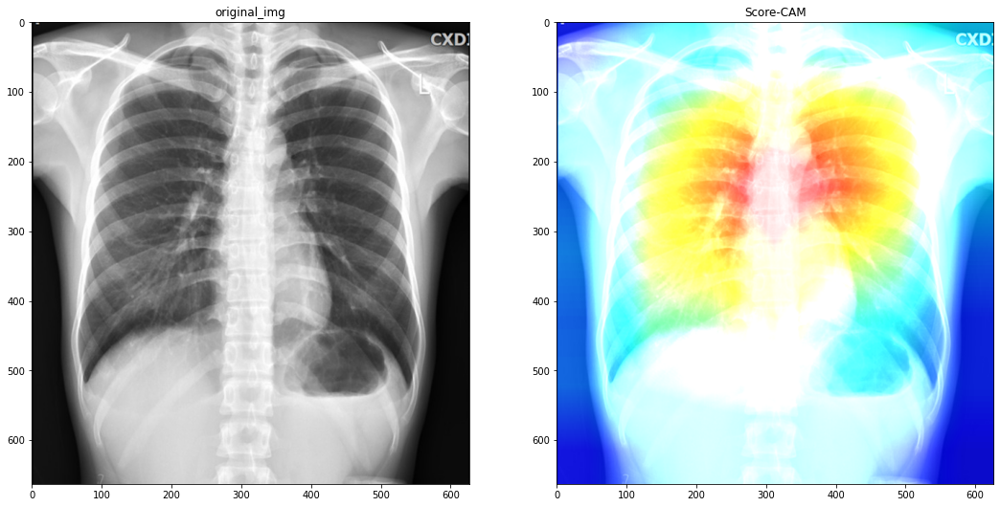

In [57]:
fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(18, 11))
ax[0].imshow(img)
ax[0].set_title("original_img")
ax[1].imshow(ss)
ax[1].set_title("Score-CAM")

##### ภาพ ca5.jpg

In [63]:
image = All_3class_dir + '/ca5.jpg'
img_array = my_preprocess_img(image)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss = superimpose(  original_img_path = image  ,  cam= relu , )       # superimposed_img_rgb  

In [59]:
ss.shape

(441, 332, 3)

In [ ]:
# import เพื่อให้โชว์รูปได้ 
from plotly import __version__
%matplotlib inline
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
cf.go_offline()

In [60]:
print(f' output form ScoreCam.shape {relu.shape},  output form superimpose.shape {ss.shape} ')

 output form ScoreCam.shape (7, 7),  output form superimpose.shape (441, 332, 3) 


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread(image)

Text(0.5, 1.0, 'Score-CAM')

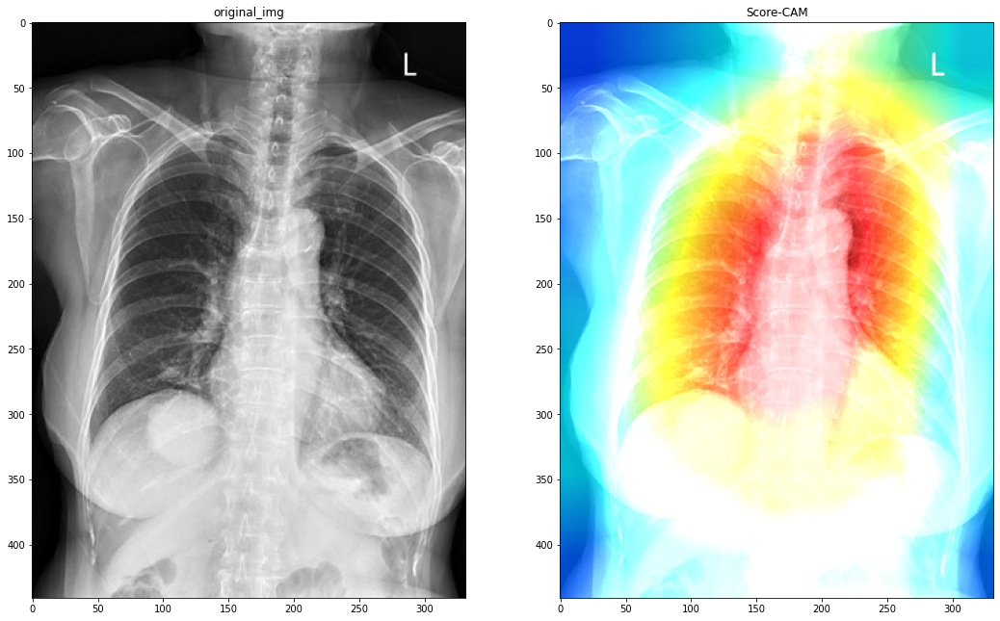

In [65]:
fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(18, 11))
ax[0].imshow(load_img(image))
ax[0].set_title("original_img")
ax[1].imshow(ss)
ax[1].set_title("Score-CAM")

#####ภาพ ca138.jpg   เปรียบเทียบวิธีอ่าน/แปลงรูปภาพเป็น array

แบบ score-CAM

In [ ]:
image = All_3class_dir + '/ca50.jpg'
img_array = read_and_preprocess_img(image)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss = superimpose(  original_img_path = image  ,  cam= relu , )       # superimposed_img_rgb  

In [ ]:
ss.shape

(439, 344, 3)

In [ ]:
# import เพื่อให้โชว์รูปได้ 
from plotly import __version__
%matplotlib inline
# import plotly.offline as pyo
# import plotly.graph_objs as go
# from plotly.offline import iplot

# import cufflinks as cf
# from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 


# cf.go_offline()

In [ ]:
print(f' output form ScoreCam.shape {relu.shape},  output form superimpose.shape {ss.shape} ')

 output form ScoreCam.shape (7, 7),  output form superimpose.shape (439, 344, 3) 


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread(image)

Text(0.5, 1.0, 'Score-CAM')

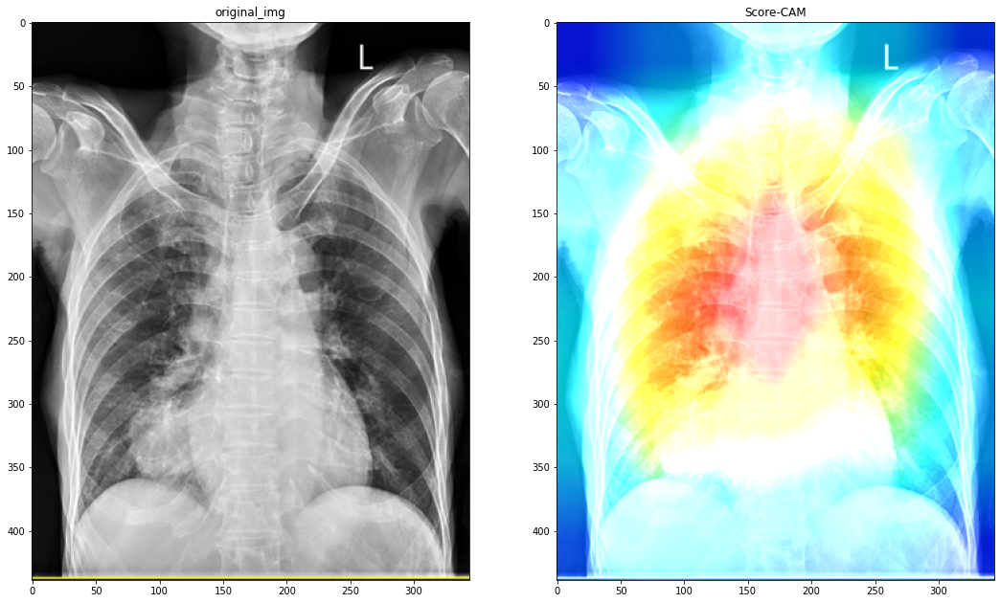

In [ ]:
fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(18, 11))
ax[0].imshow(img)
ax[0].set_title("original_img")
ax[1].imshow(ss)
ax[1].set_title("Score-CAM")

In [ ]:
pred = np.round( model16_fine_cate2.predict(img_array) , 3)
pred

array([[0., 0., 1.]], dtype=float32)

แบบ train

In [ ]:
train_img_Dense = []
           
image_path = All_3class_dir +'/ca50.jpg'               
img = cv2.imread(image_path)                        #img.shape  = (439, 344, 3)                       
img = cv2.resize(img, (224, 224))                    #img.shape   =  (224, 224, 3)         
train_img_Dense.append(img)
img_array = np.array(train_img_Dense, dtype="float32") / 255.0    #img_array.shape = (1, 224, 224, 3)

relu2 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)
ss2 = superimpose(  original_img_path = image_path  ,  cam= relu2 , )       # superimposed_img_rgb  

In [ ]:
pred = np.round( model16_fine_cate2.predict(img_array) , 3)
pred

array([[1., 0., 0.]], dtype=float32)

In [ ]:
image_path = All_3class_dir +'/ca50.jpg'               
img = cv2.imread(image_path)   

Text(0.5, 1.0, 'Score-CAM')

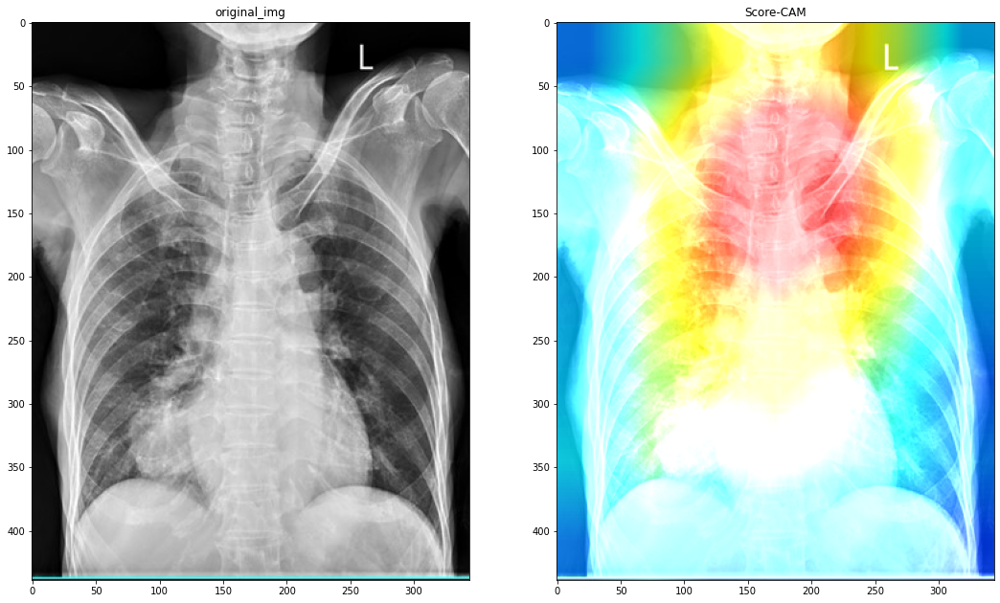

In [ ]:
fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(18, 11))
ax[0].imshow(img)
ax[0].set_title("original_img")
ax[1].imshow(ss2)
ax[1].set_title("Score-CAM")

In [ ]:
train_img_Dense = []
           
image_path = All_3class_dir +'/16.jpg'               
img = cv2.imread(image_path)                        #img.shape  = (439, 344, 3)                       
img = cv2.resize(img, (224, 224))                    #img.shape   =  (224, 224, 3)         
train_img_Dense.append(img)
img_array = np.array(train_img_Dense, dtype="float32") / 255.0    #img_array.shape = (1, 224, 224, 3)

relu3 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)
ss3 = superimpose(  original_img_path = image_path  ,  cam= relu3 , )       # superimposed_img_rgb  

In [ ]:
pred = np.round( model16_fine_cate2.predict(img_array) , 3)
pred

array([[1., 0., 0.]], dtype=float32)

In [ ]:
image_path = All_3class_dir +'/16.jpg'               
img = cv2.imread(image_path)   

Text(0.5, 1.0, 'Score-CAM')

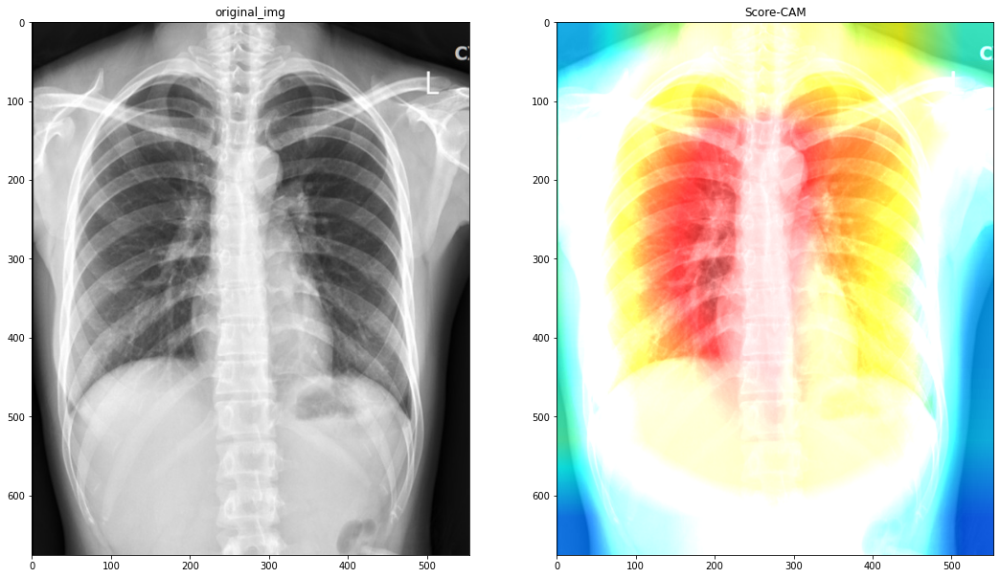

In [ ]:
fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(18, 11))
ax[0].imshow(img)
ax[0].set_title("original_img")
ax[1].imshow(ss3)
ax[1].set_title("Score-CAM")

In [ ]:
train_img_Dense = []
           
image_path = All_3class_dir +'/tb9.jpg'               
img = cv2.imread(image_path)                        #img.shape  = (439, 344, 3)                       
img = cv2.resize(img, (224, 224))                    #img.shape   =  (224, 224, 3)         
train_img_Dense.append(img)
img_array = np.array(train_img_Dense, dtype="float32") / 255.0    #img_array.shape = (1, 224, 224, 3)

relu3 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)
ss3 = superimpose(  original_img_path = image_path  ,  cam= relu3 , )       # superimposed_img_rgb  

In [ ]:
pred = np.round( model16_fine_cate2.predict(img_array) , 3)
pred

array([[0., 0., 1.]], dtype=float32)

In [ ]:
image_path = All_3class_dir +'/tb9.jpg'               
img = cv2.imread(image_path)   

Text(0.5, 1.0, 'Score-CAM')

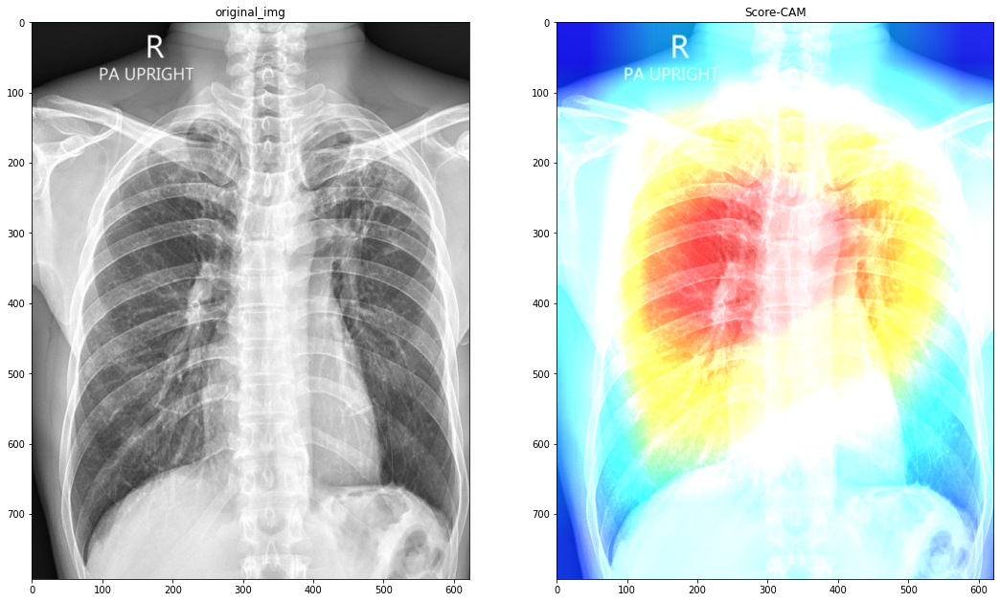

In [ ]:
fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(18, 11))
ax[0].imshow(img)
ax[0].set_title("original_img")
ax[1].imshow(ss3)
ax[1].set_title("Score-CAM")

##### 5 ภาพ  relu

In [66]:
image_ca10 = All_3class_dir + '/ca10.jpg'
img_array = my_preprocess_img(image_ca10)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_ca10 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss_ca10 = superimpose(  original_img_path = image_ca10  ,  cam= relu_ca10  )       # superimposed_img_rgb  

In [67]:
image_ca11 = All_3class_dir + '/ca11.jpg'
img_array = my_preprocess_img(image_ca11)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_ca11 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss_ca11 = superimpose(  original_img_path = image_ca11  ,  cam= relu_ca11  )       # superimposed_img_rgb  

# 8 นาที

In [68]:
image_ca12= All_3class_dir + '/ca12.jpg'
img_array = my_preprocess_img(image_ca12)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_ca12 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss_ca12 = superimpose(  original_img_path = image_ca12  ,   cam= relu_ca12  )       # superimposed_img_rgb  

In [69]:
image_10= All_3class_dir + '/10.jpg'
img_array = my_preprocess_img(image_10)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_10 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss_10 = superimpose(  original_img_path = image_10  ,   cam= relu_10  )       # superimposed_img_rgb  

In [70]:
image_tb150= All_3class_dir + '/tb150.jpg'
img_array = my_preprocess_img(image_tb150)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_tb150 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'relu' ,  max_N=-1)

ss_tb150 = superimpose(  original_img_path = image_tb150  ,   cam= relu_tb150  )       # superimposed_img_rgb  

In [71]:
# import เพื่อให้โชว์รูปได้ 
from plotly import __version__
%matplotlib inline
# import plotly.offline as pyo
# import plotly.graph_objs as go
# from plotly.offline import iplot
# import cufflinks as cf
# from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
# cf.go_offline()

Text(0.5, 1.0, 'Score-CAM')

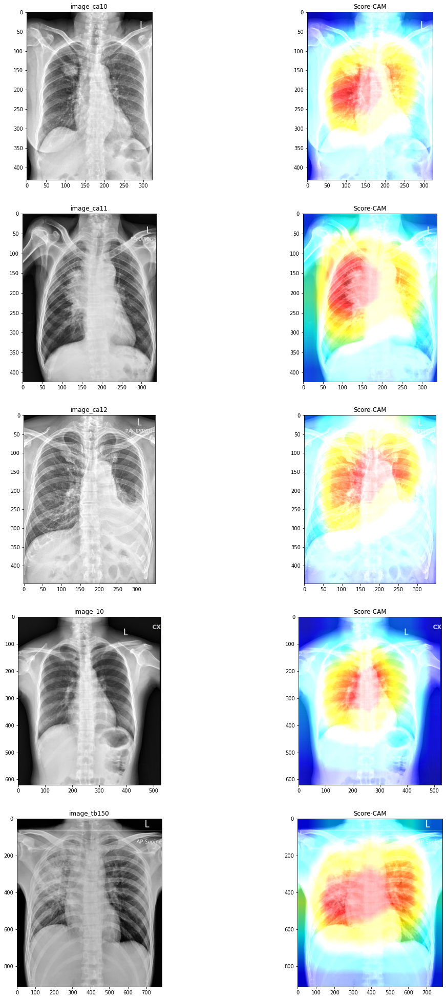

In [42]:
fig, ax = plt.subplots(nrows=5,ncols=2, figsize=(18, 35))
ax[0,0].imshow(load_img(image_ca10))
ax[0,0].set_title("image_ca10")
ax[0,1].imshow(ss_ca10)
ax[0,1].set_title("Score-CAM")

ax[1,0].imshow(load_img(image_ca11))
ax[1,0].set_title("image_ca11")
ax[1,1].imshow(ss_ca11)
ax[1,1].set_title("Score-CAM")

ax[2,0].imshow(load_img(image_ca12))
ax[2,0].set_title("image_ca12")
ax[2,1].imshow(ss_ca12)
ax[2,1].set_title("Score-CAM")

ax[3,0].imshow(load_img(image_10))
ax[3,0].set_title("image_10")
ax[3,1].imshow(ss_10)
ax[3,1].set_title("Score-CAM")

ax[4,0].imshow(load_img(image_tb150))
ax[4,0].set_title("image_tb150")
ax[4,1].imshow(ss_tb150)
ax[4,1].set_title("Score-CAM")

##5) layer_name = 'bn' 

##### 5 ภาพ bn

In [72]:
image_ca10 = All_3class_dir + '/ca10.jpg'
img_array = my_preprocess_img(image_ca10)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_ca10 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'bn' ,  max_N=-1)

bnss_ca10 = superimpose(  original_img_path = image_ca10  ,  cam= relu_ca10  )       # superimposed_img_rgb  

In [73]:
image_ca11 = All_3class_dir + '/ca11.jpg'
img_array = my_preprocess_img(image_ca11)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_ca11 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'bn' ,  max_N=-1)

bnss_ca11 = superimpose(  original_img_path = image_ca11  ,  cam= relu_ca11  )       # superimposed_img_rgb  

In [74]:
image_ca12= All_3class_dir + '/ca12.jpg'
img_array = my_preprocess_img(image_ca12)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_ca12 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'bn' ,  max_N=-1)

bnss_ca12 = superimpose(  original_img_path = image_ca12  ,   cam= relu_ca12  )       # superimposed_img_rgb  

In [75]:
image_10= All_3class_dir + '/10.jpg'
img_array = my_preprocess_img(image_10)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_10 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'bn' ,  max_N=-1)

bnss_10 = superimpose(  original_img_path = image_10  ,   cam= relu_10  )       # superimposed_img_rgb  

In [76]:
image_tb150= All_3class_dir + '/tb150.jpg'
img_array = my_preprocess_img(image_tb150)          #read_and_preprocess_img คือฟังก์ชันที่สร้างไว้

relu_tb150 = ScoreCam(  model16_fine_cate2 , img_array , layer_name = 'bn' ,  max_N=-1)

bnss_tb150 = superimpose(  original_img_path = image_tb150  ,   cam= relu_tb150  )       # superimposed_img_rgb  

In [77]:
# import เพื่อให้โชว์รูปได้ 
from plotly import __version__
%matplotlib inline
# import plotly.offline as pyo
# import plotly.graph_objs as go
# from plotly.offline import iplot

# import cufflinks as cf
# from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 


# cf.go_offline()

Text(0.5, 1.0, 'Score-CAM')

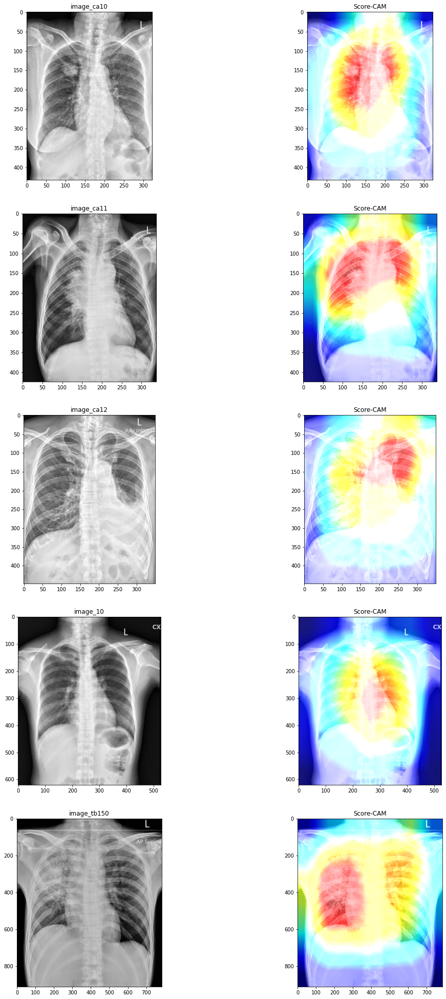

In [78]:
fig, ax = plt.subplots(nrows=5,ncols=2, figsize=(18, 35))
ax[0,0].imshow(load_img(image_ca10))
ax[0,0].set_title("image_ca10")
ax[0,1].imshow(bnss_ca10)
ax[0,1].set_title("Score-CAM")

ax[1,0].imshow(load_img(image_ca11))
ax[1,0].set_title("image_ca11")
ax[1,1].imshow(bnss_ca11)
ax[1,1].set_title("Score-CAM")

ax[2,0].imshow(load_img(image_ca12))
ax[2,0].set_title("image_ca12")
ax[2,1].imshow(bnss_ca12)
ax[2,1].set_title("Score-CAM")

ax[3,0].imshow(load_img(image_10))
ax[3,0].set_title("image_10")
ax[3,1].imshow(bnss_10)
ax[3,1].set_title("Score-CAM")

ax[4,0].imshow(load_img(image_tb150))
ax[4,0].set_title("image_tb150")
ax[4,1].imshow(bnss_tb150)
ax[4,1].set_title("Score-CAM")

##6) เปรียบเทียบ relu กับ bn

Text(0.5, 1.0, 'BatchNorm')

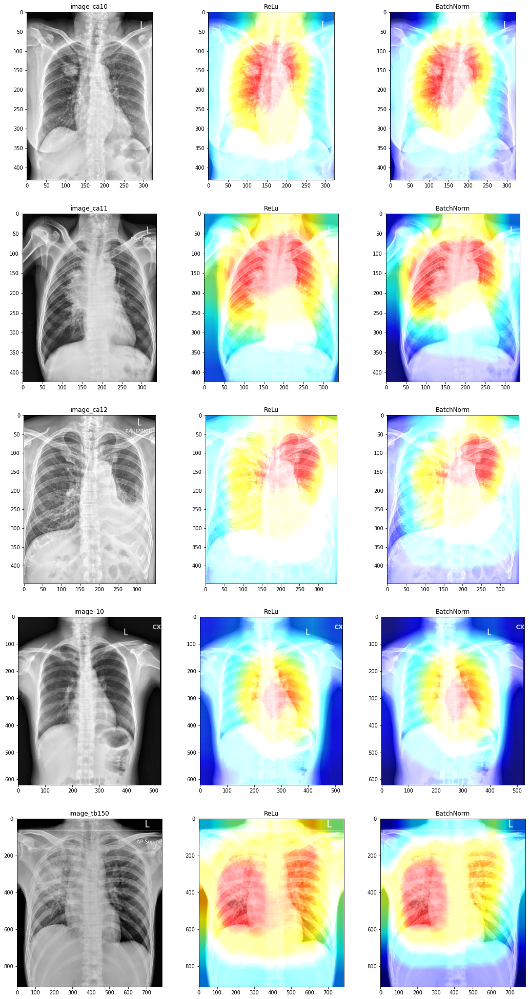

In [79]:
fig, ax = plt.subplots(nrows=5,ncols=3, figsize=(18, 35))
ax[0,0].imshow(load_img(image_ca10))
ax[0,0].set_title("image_ca10")
ax[0,1].imshow(ss_ca10)
ax[0,1].set_title("ReLu")
ax[0,2].imshow(bnss_ca10)
ax[0,2].set_title("BatchNorm")

ax[1,0].imshow(load_img(image_ca11))
ax[1,0].set_title("image_ca11")
ax[1,1].imshow(ss_ca11)
ax[1,1].set_title("ReLu")
ax[1,2].imshow(bnss_ca11)
ax[1,2].set_title("BatchNorm")

ax[2,0].imshow(load_img(image_ca12))
ax[2,0].set_title("image_ca12")
ax[2,1].imshow(ss_ca12)
ax[2,1].set_title("ReLu")
ax[2,2].imshow(bnss_ca12)
ax[2,2].set_title("BatchNorm")

ax[3,0].imshow(load_img(image_10))
ax[3,0].set_title("image_10")
ax[3,1].imshow(ss_10)
ax[3,1].set_title("ReLu")
ax[3,2].imshow(bnss_10)
ax[3,2].set_title("BatchNorm")

ax[4,0].imshow(load_img(image_tb150))
ax[4,0].set_title("image_tb150")
ax[4,1].imshow(ss_tb150)
ax[4,1].set_title("ReLu")
ax[4,2].imshow(bnss_tb150)
ax[4,2].set_title("BatchNorm")